# Coding task for the 2nd research seminar

"Explaining and Harnessing Adversarial Examples"

[paper](https://arxiv.org/abs/1412.6572)


1.   Work on Alexnet, with Cifar10
2.   Make sure that the network classifies correctly
3.   Create adversarial examples, over different type of classes
4.   For each example plot several images, using different strength (starting from examples that are classified correctly to those who are not and have a very large strength).
5.   Try this example of a different model


# 1. Training AlexNet on Cifar10 dataset

## Imports & constants

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

!pip install torchsummary 
from torchsummary import summary

import torch
import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import datasets, models, transforms
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn.functional as F
import time
import os
import copy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
CLASS_NAMES = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

## Functions

In [ ]:
# Check for the availability of a GPU, and use CPU otherwise
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [ ]:
def plot_convergence(dict_res, num_epochs):
  fig, axes = plt.subplots(1, 2, figsize=(14,4))
  types=['Loss', 'Accuracy']
  plt.subplot(1,2,1); plt.plot(dict_res['train'][0]); plt.plot(dict_res['val'][0]); plt.title('Loss'); plt.legend(['train','val'])
  plt.subplot(1,2,2); plt.plot(dict_res['train'][1]); plt.plot(dict_res['val'][1]); plt.title('Accuracy'); plt.legend(['train','val'])


In [ ]:
def train_model(model, dataloaders, criterion, optimizer, scheduler=False, num_epochs=25, silent=False):
    since = time.time()
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f'The learning on {device}')
    model.to(device)

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    train_res= np.zeros((2,num_epochs))
    val_res=np.zeros((2,num_epochs))
    dict_res={'train':train_res, 'val':val_res}

    for epoch in range(num_epochs):
        if not silent:
            print('Epoch {}/{}'.format(epoch, num_epochs - 1))
            print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer

                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
            # if phase == 'train':
            #     # Adjust the learning rate based on the scheduler
            #     scheduler.step()  

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if not silent:
                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            dict_res[phase][0,epoch]=epoch_loss
            dict_res[phase][1,epoch]=epoch_acc

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())
        if not silent:
            print()
        
        time_elapsed = time.time() - since
        print(f'Epoch complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, dict_res

In [ ]:

def imshow(inp, title=None):
    """Imshow for Tensor."""
    # Convert to Numpy if needed
    if not isinstance(inp, np.ndarray):
        inp = inp.numpy()
    inp = inp.transpose((1, 2, 0))
    inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(5,3), dpi=300)
    plt.axis('off')
    plt.imshow(inp)
    if title is not None:
       plt.title(title, fontsize=5)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
def visualize_model(model, desired_size = 32, num_images=8, class_names=CLASS_NAMES):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    
    plt.figure(figsize=(3,3))
    # plt.figure(figsize=(2,1))
    #fig, ax = subplots(figsize=(18, 2))

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1

                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                
                # define transformt to resize the image with given size
                transform = transforms.Resize(size = (desired_size,desired_size))

                # apply the transform on the input image
                img = inputs.cpu().data[j]
                img = transform(img)
                print('img shape:', img.shape)
                imshow(img)

                # # Create a transform to resize the image
                # print('desired_size:', desired_size)      
                # resize = transforms.Resize((desired_size, desired_size))

                # Display the resized image using imshow
                # imshow(resize(inputs.cpu().data[j]))
                # imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)


        # out = torchvision.utils.make_grid(inputs, nrow=num_images//2)
        # imshow(out, title=title )

## Load cifar

### Define the get_datloader function

In [ ]:
def get_dataloader(batch_size = 128):
    """
    Defines transformers and data_loaders for CIFAR10
    """
    # Define transformations that resize the images to 256x256, and normalize them. 
    # The means and standard deviations for CIFAR10
    means = [0.491, 0.482 ,0.446] 
    stds = [0.247, 0.2435, 0.262]

    data_transforms = {
        'train': transforms.Compose([
            transforms.Resize((256, 256)),  # H: ImageNet gets these dimensions 
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(), 
            # transforms.Normalize(means, stds) # Doesn't work with the need for 0, 1 limits
        ]),
        'val': transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            # transforms.Normalize(means, stds)
        ]),
    }

    image_train = torchvision.datasets.CIFAR10(root='./data', train=True,
                                            download=True, transform=data_transforms['train'])
    image_val = torchvision.datasets.CIFAR10(root='./data', train=False,
                                          download=True, transform=data_transforms['val'])


    dataloaders = {
        'train': torch.utils.data.DataLoader(image_train, batch_size=batch_size,
                                                shuffle=True, num_workers=2),
        'val': torch.utils.data.DataLoader(image_val, batch_size=batch_size,
                                              shuffle=False, num_workers=2)
      }
    return dataloaders, image_train, image_val


### Defining the dataloaders

In [ ]:
dataloaders, image_train, image_val = get_dataloader(batch_size=128)

dataset_sizes={'train': 0, 'test': 0}
dataset_sizes['train'] = len(image_train)
dataset_sizes['val'] = len(image_val)


print('dataset_sizes:')
print('Train:', len(image_train))
print('Val:', len(image_val))

100%|██████████| 170498071/170498071 [00:01<00:00, 99484720.15it/s] 


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
dataset_sizes:
Train: 50000
Val: 10000


## Visualize some of the training images

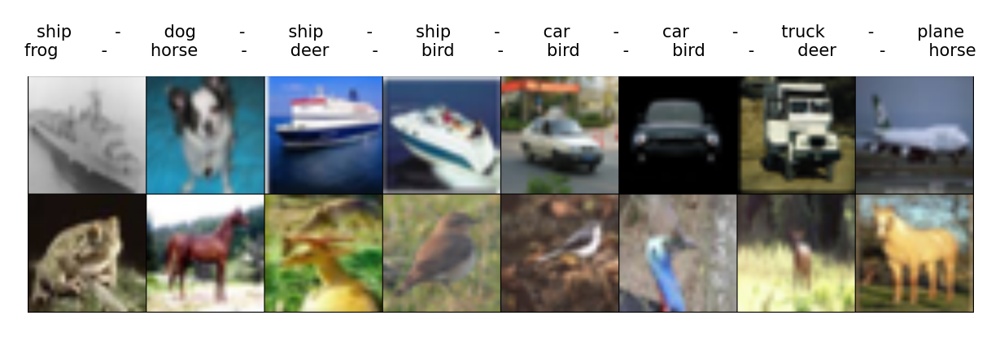

In [ ]:
inputs, classes = next(iter(dataloaders['train']))
inputs = inputs[0:16]
classes_1 = classes[0:8]
classes_2 = classes[8:16]

title = '        -        '.join([CLASS_NAMES[x] for x in classes_1]) + '\n' + '        -        '.join([CLASS_NAMES[x] for x in classes_2]) 

# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=8)
imshow(out, title=title )#'\n'.join([class_names[x] for x in classes]))

In [ ]:
inputs.max()

tensor(1.)

In [ ]:
inputs[0].shape

torch.Size([3, 256, 256])

## Load and train AlexNet

In [ ]:
# Inatiate the network
model_alexnet = models.alexnet(pretrained=True)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:04<00:00, 60.3MB/s]


In [ ]:
model_alexnet.classifier[6] = nn.Linear(in_features=4096, out_features=len(CLASS_NAMES))
model_alexnet

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(model_alexnet.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 63, 63]          23,296
              ReLU-2           [-1, 64, 63, 63]               0
         MaxPool2d-3           [-1, 64, 31, 31]               0
            Conv2d-4          [-1, 192, 31, 31]         307,392
              ReLU-5          [-1, 192, 31, 31]               0
         MaxPool2d-6          [-1, 192, 15, 15]               0
            Conv2d-7          [-1, 384, 15, 15]         663,936
              ReLU-8          [-1, 384, 15, 15]               0
            Conv2d-9          [-1, 256, 15, 15]         884,992
             ReLU-10          [-1, 256, 15, 15]               0
           Conv2d-11          [-1, 256, 15, 15]         590,080
             ReLU-12          [-1, 256, 15, 15]               0
        MaxPool2d-13            [-1, 256, 7, 7]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
# Define the loss function
# For a multi-class problem, you'd usually prefer CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.Adam(model_alexnet.parameters(), lr=0.001)
# exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Define the number of epochs
num_epochs = 3

# learn:
model_alexnet, dict_res = train_model(model_alexnet, 
                       dataloaders,
                       criterion, 
                       optimizer, 
                       num_epochs=num_epochs)



The learning on cuda:0
Epoch 0/2
----------
train Loss: 1.9024 Acc: 0.2786
val Loss: 1.3662 Acc: 0.4966

Epoch complete in 2m 18s
Epoch 1/2
----------
train Loss: 1.2399 Acc: 0.5519
val Loss: 1.0344 Acc: 0.6358

Epoch complete in 4m 20s
Epoch 2/2
----------
train Loss: 0.9655 Acc: 0.6591
val Loss: 0.7806 Acc: 0.7317

Epoch complete in 6m 28s
Training complete in 6m 28s
Best val Acc: 0.731700


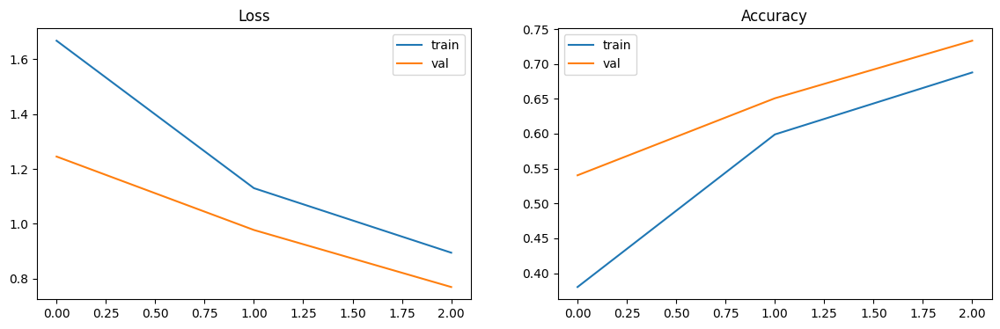

In [ ]:
# plot
plot_convergence(dict_res, num_epochs)

# 2. Visualizing the model success

## Printing examples

In [ ]:
def visualize_model_0(model, num_images=6):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    # plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1

                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(CLASS_NAMES[preds[j]]))

                # define transformt to resize the image with given size
                desired_size = 32
                transform = transforms.Resize(size = (desired_size,desired_size))

                # apply the transform on the input image
                img = inputs.cpu().data[j]
                # img = transform(img)
                print('img shape:', img.shape)
                imshow(img)

                #imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)

In [ ]:
def visualize_model_2(model, num_images=8):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    images = []
    names = []
    classes = []
    # plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
              
                img = inputs.cpu().data[j]
                images.append(img)
                name = CLASS_NAMES[preds[j]]
                names.append(name)
                classes.append(labels.cpu().data[j])

                # Plot all images at the end:
                if images_so_far == num_images:
                    model.train(mode=was_training)
                    classes_1 = classes[0:num_images//2]
                    classes_2 = classes[num_images//2:num_images]
                    tab = '        -        '
                    title_label = 'LABELS:' + '\n' + tab.join([CLASS_NAMES[x] for x in classes_1]) + '\n' + tab.join([CLASS_NAMES[x] for x in classes_2]) 
                    title_pred = 'PREDICTED:' + '\n' + tab.join(x for x in names[0:num_images//2]) + '\n' + tab.join(x for x in names[num_images//2:num_images]) 
                    title = title_pred + '\n' + title_label
                    out = torchvision.utils.make_grid(images, nrow=num_images//2)
                    imshow(out, title=title)
                    return #images, names
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)

    
    

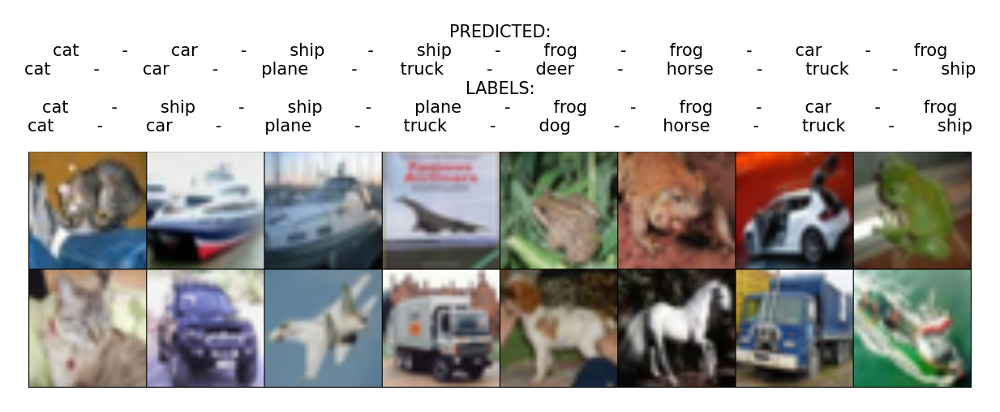

In [ ]:
visualize_model_2(model_alexnet,num_images=16)

In [ ]:
# visualize_model(model_alexnet)

## Printing a classification report and plotting a confusion matrix

### Defining functions

In [ ]:
def predict_labels(model, phase='val'):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    all_preds = []
    all_labels = []

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders[phase]):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds += preds.tolist()
            all_labels += labels.tolist()
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)
    
    return all_preds, all_labels

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def eval_model(model, phase='val'):
    # Collecting the predictions 
    all_preds, all_labels = predict_labels(model, phase=phase)

    # Printing the classification report
    print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES))

    # Plotting the confusion matrix
    fig, ax = plt.subplots()  #create figure and axes

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)
    #plt.xticks(ha="right", rotation=45)

    disp.plot(ax=ax)

    plt.setp(ax.get_xticklabels(), ha="right", rotation=45);
    fig.set_size_inches(8.5, 8.5)

    # Returning the confusion matrix
    return cm

### Plotting

              precision    recall  f1-score   support

       plane       0.76      0.77      0.77      1000
         car       0.84      0.89      0.87      1000
        bird       0.68      0.59      0.63      1000
         cat       0.49      0.66      0.57      1000
        deer       0.68      0.71      0.69      1000
         dog       0.71      0.53      0.61      1000
        frog       0.81      0.73      0.77      1000
       horse       0.78      0.75      0.76      1000
        ship       0.82      0.83      0.82      1000
       truck       0.82      0.85      0.84      1000

    accuracy                           0.73     10000
   macro avg       0.74      0.73      0.73     10000
weighted avg       0.74      0.73      0.73     10000



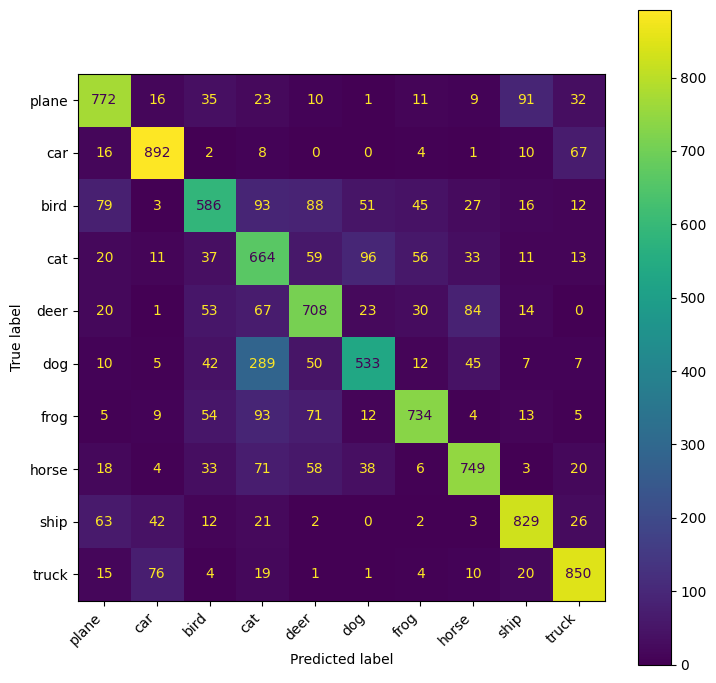

In [ ]:
cm = eval_model(model_alexnet, phase='val')

We can see the classification is quite good, and that he model confuses between cats and dogs and plans and birds.

# 3. Creating adversarial examples

A tutorial for ADVERSARIAL EXAMPLE GENERATION using Pytorch:

https://pytorch.org/tutorials/beginner/fgsm_tutorial.html

This part uses this formula to create the adversarial examples (Goodfellow et al., 2015)

 $η = ϵ*sign(\nabla _{x}J\left( \theta,x,y \right))$

## Defining functions

Defining a function that creates the adversarial examples.    
* x - image - the original image
* $ϵ$ - epsilon - the perturbation size
* $\nabla _{x}J\left( \theta,x,y \right)$ - data_grad - the grdient of the loss (with respect to the image)

In [ ]:
# FGSM attack code
def fgsm_attack(image, epsilon, data_grad):
    """
    Runs the attach and creates the disrapted (perturbed) image
    """
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

In [ ]:
def test(model, device, test_loader, epsilon, num_examples=5):
    """
    Loop over all the examples in the test set and 
    send the adv. attack on the images that were correcly classified.
    """
    model.eval()
    # Accuracy counter
    correct = 0
    adv_examples = []
    original_examples = []

    # Loop over all examples in test set
    for data, target in test_loader:

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        # Apply the softmax function to the output tensor
        probs = F.softmax(output, dim=1)
        # Get the probability of the predicted class
        init_prob = probs.gather(1, init_pred).squeeze()
        # print()  # TEMP
        # If the initial prediction is wrong, don't bother attacking, just move on
        if init_pred.item() != target.item():
            # print('! Incorrect classification:', init_pred.item(), target.item())
            continue
        
        # print('% Correct classification:', init_pred.item(), target.item())
        # Calculate the loss
        loss = F.nll_loss(output, target)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect "datagrad"
        data_grad = data.grad.data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        # Re-classify the perturbed image
        output = model(perturbed_data)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        # Apply the softmax function to the output tensor
        probs = F.softmax(output, dim=1)
        # Get the probability of the predicted class
        final_prob = probs.gather(1, final_pred).squeeze()

        if final_pred.item() == target.item():
            # print('%% Correct classification after change:', init_pred.item(), final_pred.item(), target.item())
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < num_examples):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                original_data = data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), init_prob, final_pred.item(),final_prob, adv_ex, original_data) )

        else:
            # print('%! Incorrect classification after change:', init_pred.item(), final_pred.item(), target.item())
            # Save some adv examples for visualization later
            if len(adv_examples) < num_examples:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                original_data = data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(),init_prob, final_pred.item(), final_prob, adv_ex, original_data) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print(f'Epsilon value: {epsilon}\tTest Accuracy = {correct} / {len(test_loader)} = {final_acc}')

    # cm = eval_model(model)

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

### Examples af the images after attack

In [ ]:
epsilons = np.logspace(-3, -1, num=6).round(3)
epsilons = np.insert(epsilons, 0, 0)
epsilons

array([0.   , 0.001, 0.003, 0.006, 0.016, 0.04 , 0.1  ])

## Running the adversial attack

In [ ]:
# Creating data loaders with batch size of 1
adv_dataloaders, _, _ = get_dataloader(batch_size=1)

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
epsilons = np.logspace(-3, -1, num=6).round(3)
epsilons = np.insert(epsilons, 0, 0)
epsilons

array([0.   , 0.001, 0.003, 0.006, 0.016, 0.04 , 0.1  ])

In [ ]:
# Defining epsilon sizes
epsilons = [0, .05, .1, .15, .2, .25, .3]
#epsilons = np.logspace(-3, -1, num=5).round(3)
accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model_alexnet, device, adv_dataloaders['val'], eps)
    accuracies.append(acc)
    examples.append(ex)

In [ ]:
# Defining epsilon sizes
epsilons = np.logspace(-3, -1, num=6).round(3)
# Adding zero in the beginning
epsilons = np.insert(epsilons, 0, 0)
accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model_alexnet, device, adv_dataloaders['val'], eps)
    accuracies.append(acc)
    examples.append(ex)

Epsilon value: 0.0	Test Accuracy = 7317 / 10000 = 0.7317
Epsilon value: 0.001	Test Accuracy = 6164 / 10000 = 0.6164
Epsilon value: 0.003	Test Accuracy = 4397 / 10000 = 0.4397
Epsilon value: 0.006	Test Accuracy = 2806 / 10000 = 0.2806
Epsilon value: 0.016	Test Accuracy = 955 / 10000 = 0.0955
Epsilon value: 0.04	Test Accuracy = 633 / 10000 = 0.0633
Epsilon value: 0.1	Test Accuracy = 853 / 10000 = 0.0853


In [ ]:
print('accuracies:\n', accuracies)

accuracies:
 [0.7317, 0.6164, 0.4397, 0.2806, 0.0955, 0.0633, 0.0853]


## Plot the effect of $ϵ$ over the accuracy 

In [ ]:
def plot_eps_vs_acc(epsilons, accuracies, examples):
    """
    Plots the influence of the epsilon over the model accuracy
    """
    plt.figure(figsize=(5,5))
    plt.plot(epsilons, accuracies, "*-")
    plt.yticks(np.arange(0, 1.1, step=0.1))
    plt.xscale('log')
    plt.title("Accuracy vs Epsilon")
    plt.xlabel("Epsilon")
    plt.ylabel("Accuracy")
    plt.show()

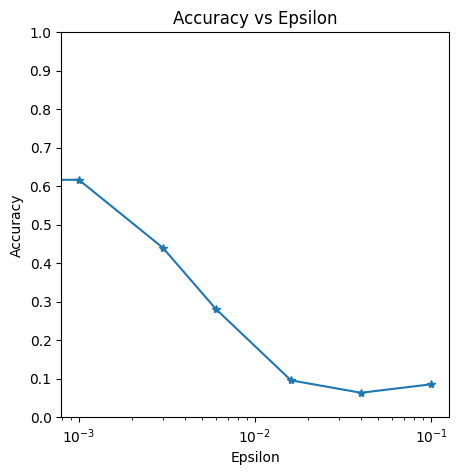

In [ ]:
plot_eps_vs_acc(epsilons, accuracies, examples)

# 4. Plotting the adversarial examples

In [ ]:
def plot_adv_examples(epsilons, accuracies, examples):
    """
    Plot adv. examples for each epsilon
    """
    cnt = 0
    # plt.figure(figsize=(8,10))
    for i in range(len(epsilons)):
        for j in range(len(examples[i])):
            cnt += 1
            orig,init_prob, adv, final_prob,ex, original_data = examples[i][j]
            inputs = [torch.from_numpy(original_data),torch.from_numpy(ex)] 
            pau = '                    '
            pau2 = '                          '
            title = f'Eps: {epsilons[i]}\n{CLASS_NAMES[orig]}{pau2}{CLASS_NAMES[adv]}\n{init_prob:.4f}{pau}{final_prob:.4f}'

            # Make a grid from batch
            plt.figure(figsize=(3,3))
            inp = torchvision.utils.make_grid(inputs, nrow=2)
            # inp = 
        # def imshow(inp, title=None):
            """Imshow for Tensor."""
            # Convert to Numpy if needed
            if not isinstance(inp, np.ndarray):
                inp = inp.numpy()
            inp = inp.transpose((1, 2, 0))
            inp = np.clip(inp, 0, 1)
            fig = plt.figure(figsize=(2,2), dpi=300)
            plt.imshow(inp)
            plt.axis('off')
            if title is not None:
              plt.title(title, fontsize=5)
            plt.pause(0.001)  # pause a bit so that plots are updated
            # imshow(out, title=title )

    plt.tight_layout()
    # plt.show()

<Figure size 300x300 with 0 Axes>

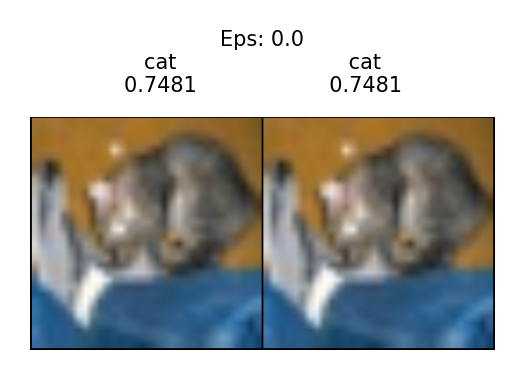

<Figure size 300x300 with 0 Axes>

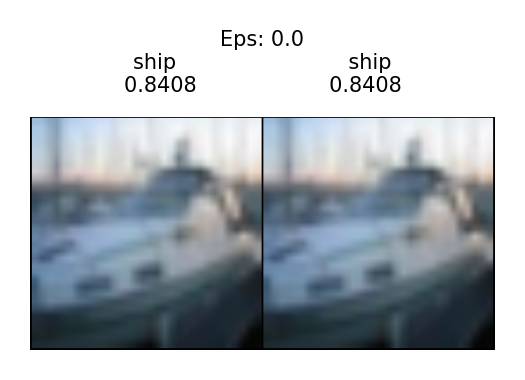

<Figure size 300x300 with 0 Axes>

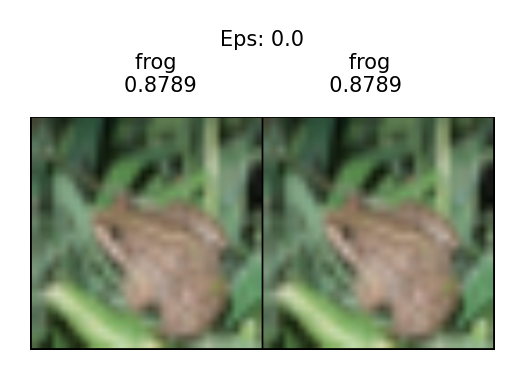

<Figure size 300x300 with 0 Axes>

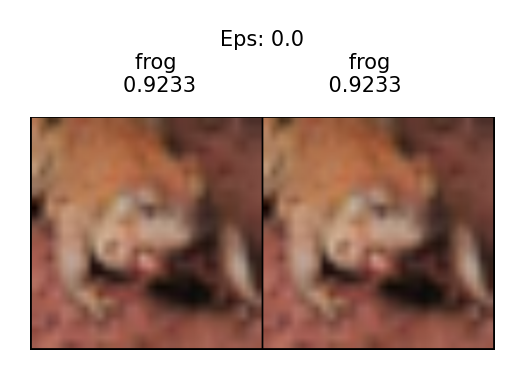

<Figure size 300x300 with 0 Axes>

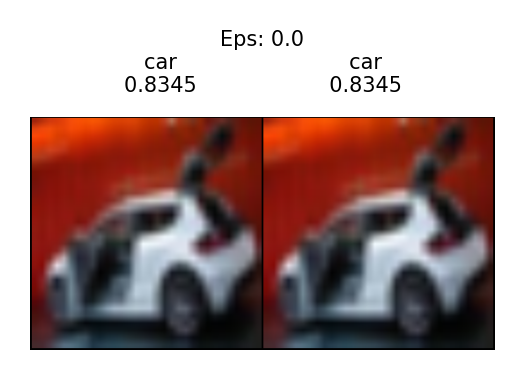

<Figure size 300x300 with 0 Axes>

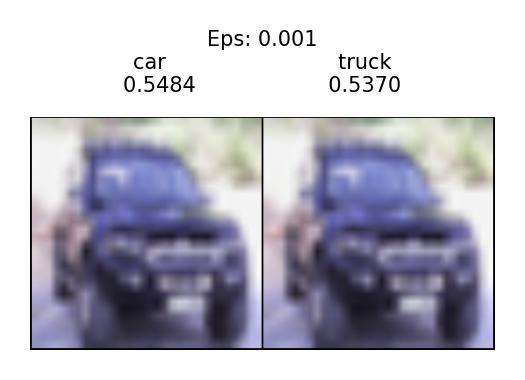

<Figure size 300x300 with 0 Axes>

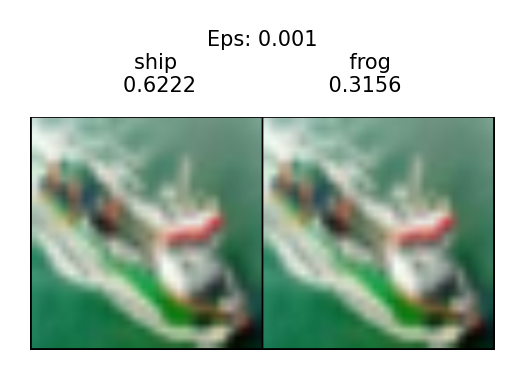

<Figure size 300x300 with 0 Axes>

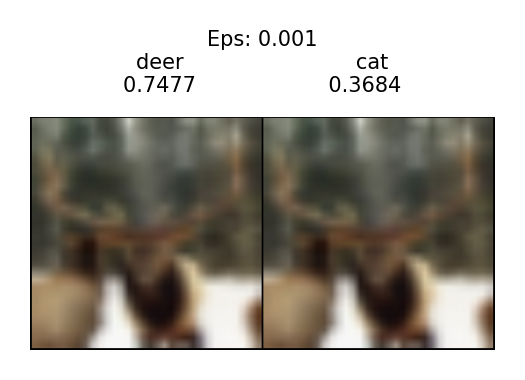

<Figure size 300x300 with 0 Axes>

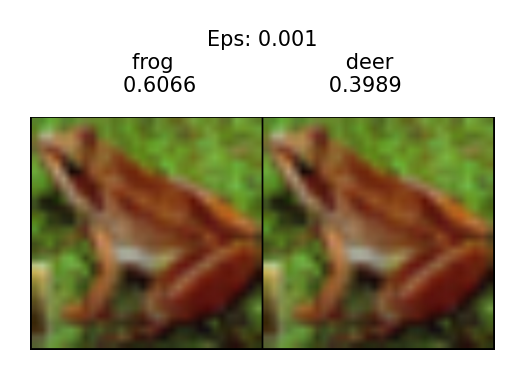

<Figure size 300x300 with 0 Axes>

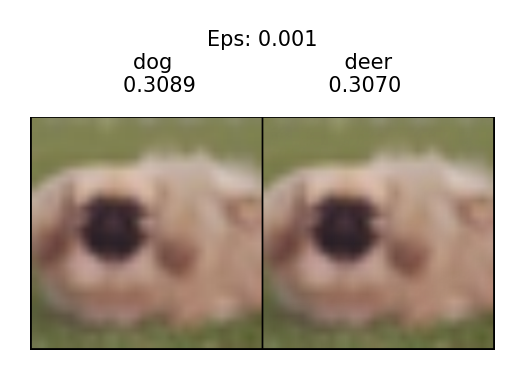

<Figure size 300x300 with 0 Axes>

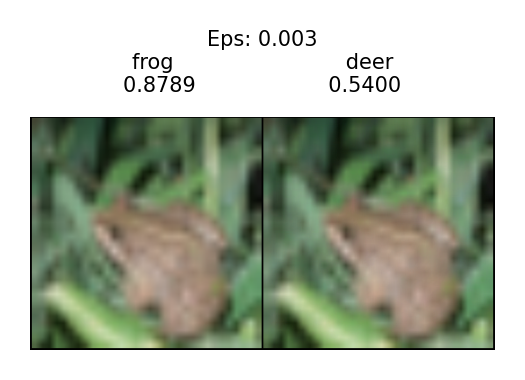

<Figure size 300x300 with 0 Axes>

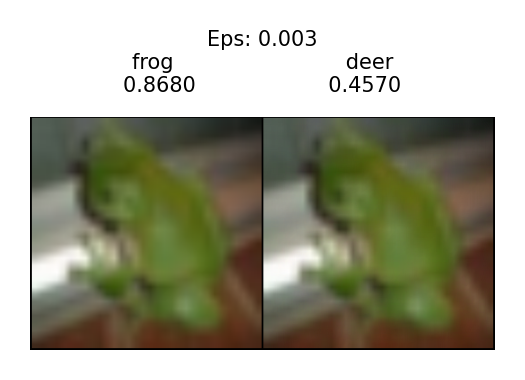

<Figure size 300x300 with 0 Axes>

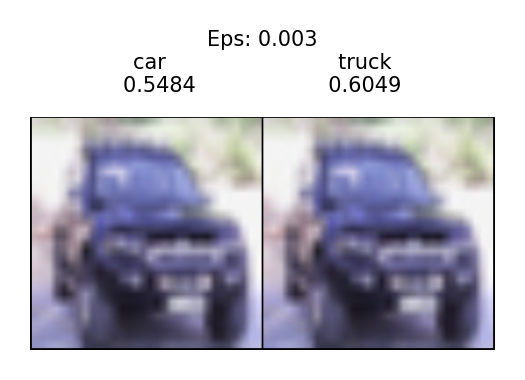

<Figure size 300x300 with 0 Axes>

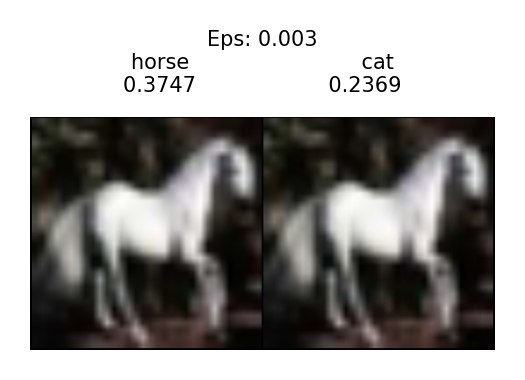

<Figure size 300x300 with 0 Axes>

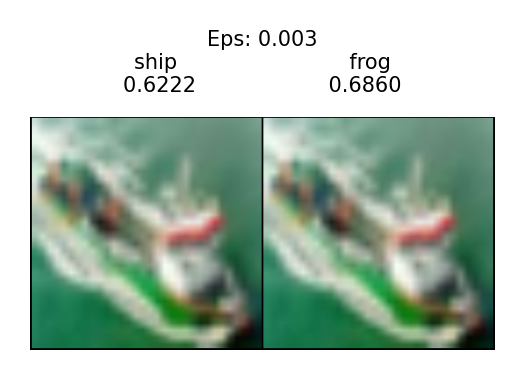

<Figure size 300x300 with 0 Axes>

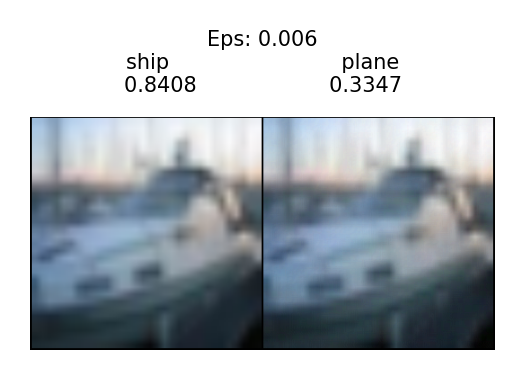

<Figure size 300x300 with 0 Axes>

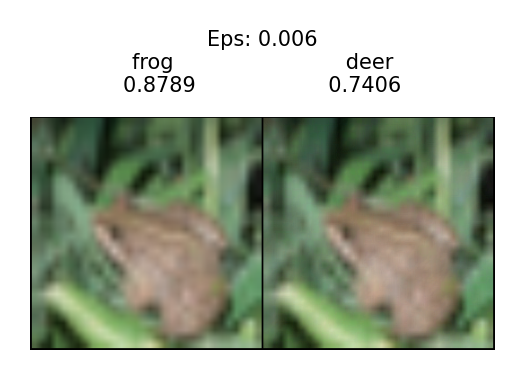

<Figure size 300x300 with 0 Axes>

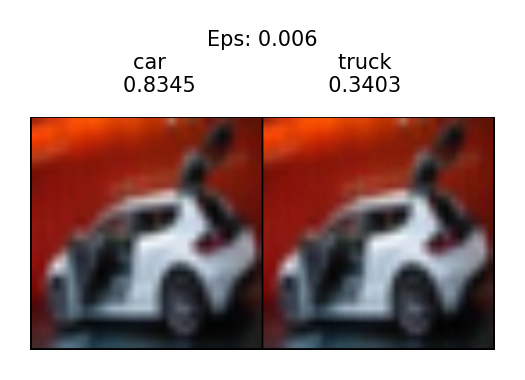

<Figure size 300x300 with 0 Axes>

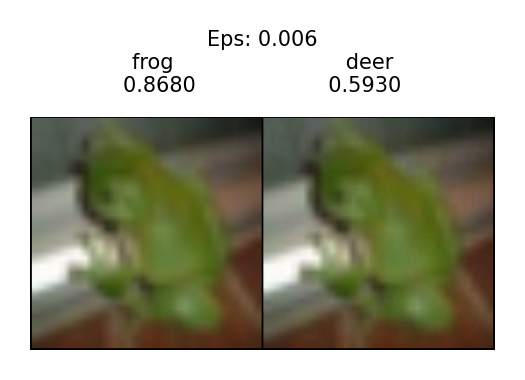

<Figure size 300x300 with 0 Axes>

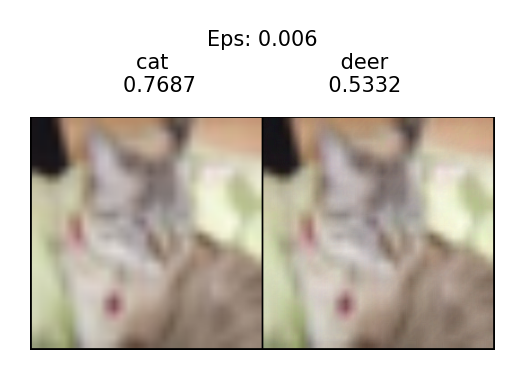

<Figure size 300x300 with 0 Axes>

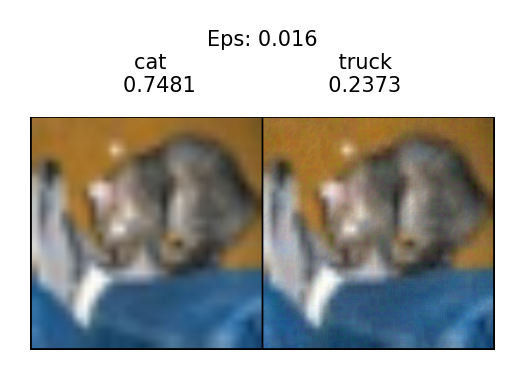

<Figure size 300x300 with 0 Axes>

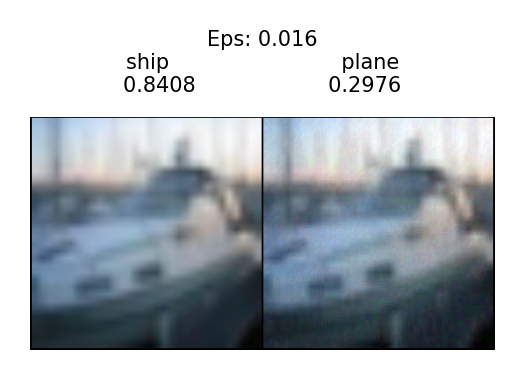

<Figure size 300x300 with 0 Axes>

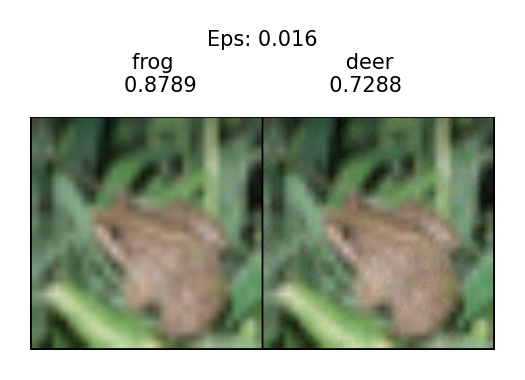

<Figure size 300x300 with 0 Axes>

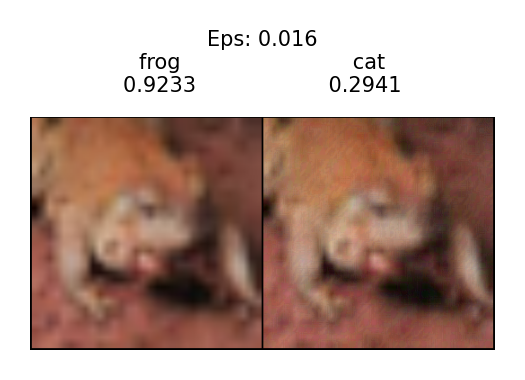

<Figure size 300x300 with 0 Axes>

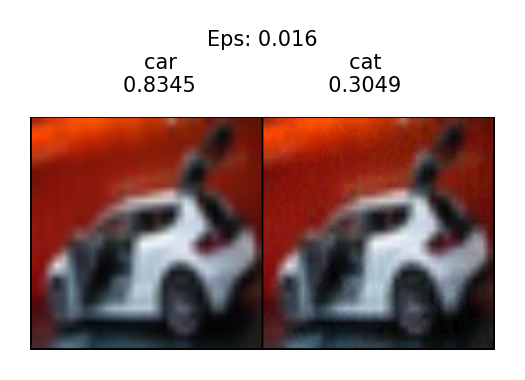

<Figure size 300x300 with 0 Axes>

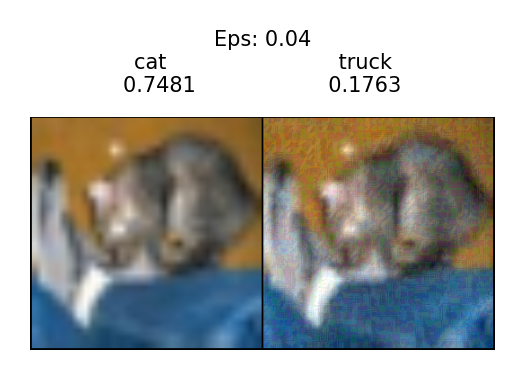

<Figure size 300x300 with 0 Axes>

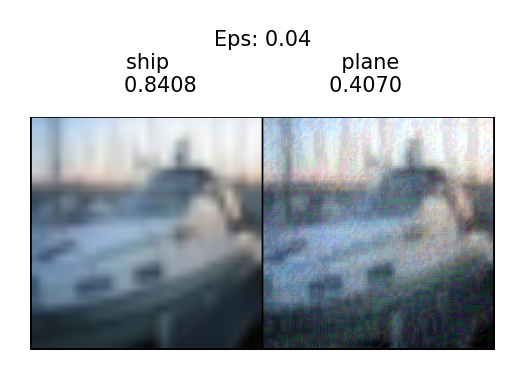

<Figure size 300x300 with 0 Axes>

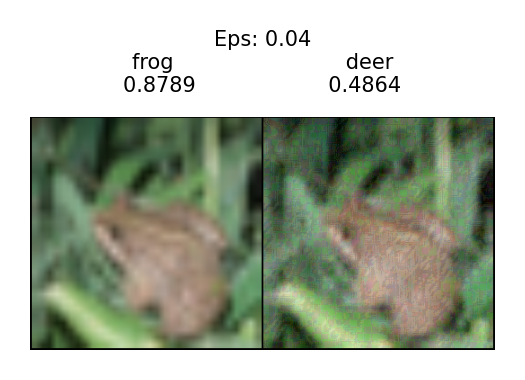

<Figure size 300x300 with 0 Axes>

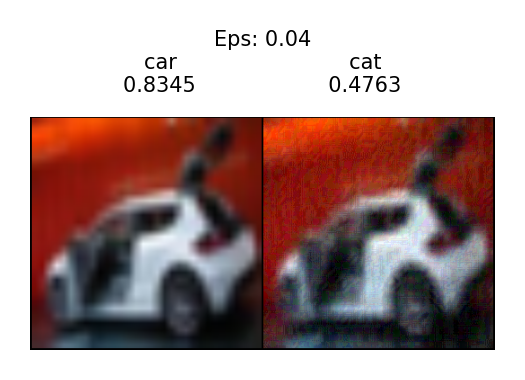

<Figure size 300x300 with 0 Axes>

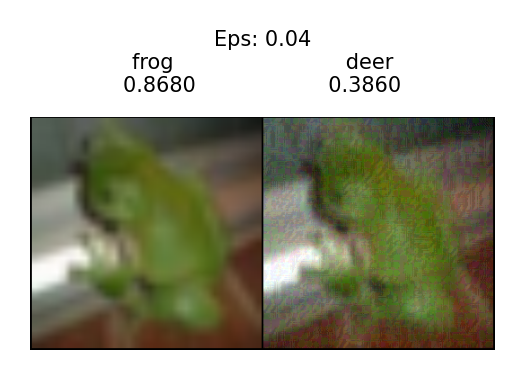

<Figure size 300x300 with 0 Axes>

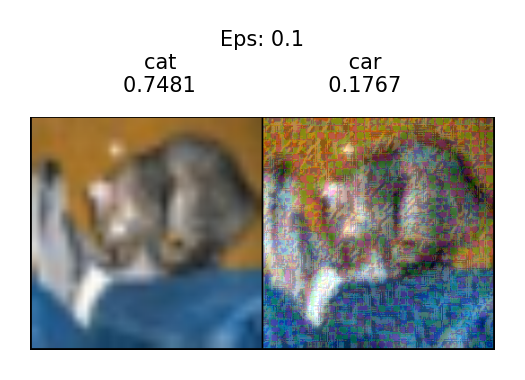

<Figure size 300x300 with 0 Axes>

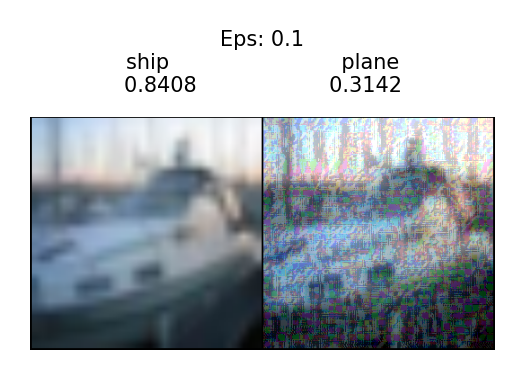

<Figure size 300x300 with 0 Axes>

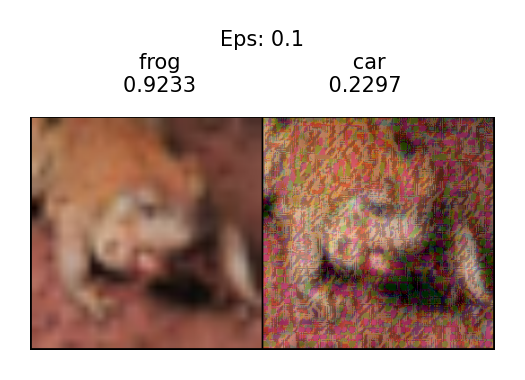

<Figure size 300x300 with 0 Axes>

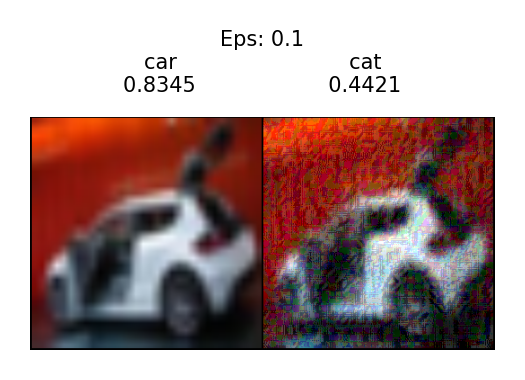

<Figure size 300x300 with 0 Axes>

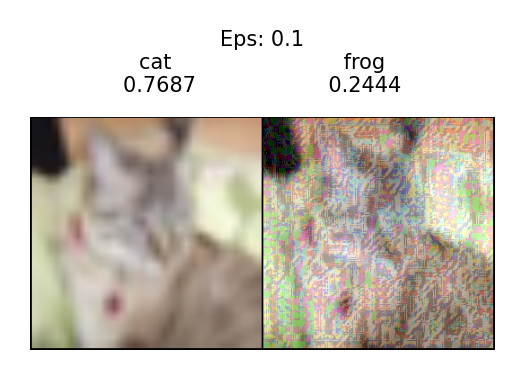

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_adv_examples(epsilons, accuracies, examples)

In [ ]:
def eval_model_adv(model, phase='val'):
    # Collecting the predictions 
    all_preds, all_labels = predict_labels(model, phase=phase)

    # Printing the classification report
    print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES))

    # Plotting the confusion matrix
    fig, ax = plt.subplots()  #create figure and axes

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)
    #plt.xticks(ha="right", rotation=45)

    disp.plot(ax=ax)

    plt.setp(ax.get_xticklabels(), ha="right", rotation=45);
    fig.set_size_inches(8.5, 8.5)

    # Returning the confusion matrix
    return cm

# 5. Using another model

## Defining the GoogLeNet model

We chose to work with **GoogLeNet**, which shows high accuracy and uses only 5M parameters.

In [ ]:
# Inatiate the network
model_gln = models.googlenet(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 53.1MB/s]


In [ ]:
model_gln.fc = nn.Linear(in_features=1024, out_features=10, bias=True)
model_gln

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [ ]:
model_gln.fc = Linear(in_features=1024, out_features=10, bias=True)

In [ ]:
# Adjusting the last layer to CIFAR
model_gln.fc = nn.Linear(in_features=1024, out_features=len(CLASS_NAMES))
# model_gln.classifier[6] = nn.Linear(in_features=4096, out_features=len(CLASS_NAMES))
model_gln

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [ ]:
summary(model_gln.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
       BasicConv2d-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
       BasicConv2d-7           [-1, 64, 64, 64]               0
            Conv2d-8          [-1, 192, 64, 64]         110,592
       BatchNorm2d-9          [-1, 192, 64, 64]             384
      BasicConv2d-10          [-1, 192, 64, 64]               0
        MaxPool2d-11          [-1, 192, 32, 32]               0
           Conv2d-12           [-1, 64, 32, 32]          12,288
      BatchNorm2d-13           [-1, 64, 32, 32]             128
      BasicConv2d-14           [-1, 64,

### Defining data loaders

In [ ]:
dataloaders_gln, image_train, image_val = get_dataloader(batch_size=128)

print('dataset_sizes:')
print('Train:', len(image_train))
print('Val:', len(image_val))

Files already downloaded and verified
Files already downloaded and verified
dataset_sizes:
Train: 50000
Val: 10000


In [ ]:
# Define the loss function
# For a multi-class problem, you'd usually prefer CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.Adam(model_gln.parameters(), lr=0.001)
# exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Define the number of epochs
num_epochs = 3

# learn:
model_gln, dict_res = train_model(model_gln, 
                       dataloaders_gln,
                       criterion, 
                       optimizer, 
                      #  exp_lr_scheduler,
                       num_epochs=num_epochs)



The learning on cuda:0
Epoch 0/2
----------
train Loss: 0.4381 Acc: 0.8522
val Loss: 0.3616 Acc: 0.8776

Epoch complete in 4m 20s
Epoch 1/2
----------
train Loss: 0.2585 Acc: 0.9112
val Loss: 0.3792 Acc: 0.8787

Epoch complete in 8m 44s
Epoch 2/2
----------
train Loss: 0.2047 Acc: 0.9291
val Loss: 0.3360 Acc: 0.8855

Epoch complete in 13m 16s
Training complete in 13m 16s
Best val Acc: 0.885500


## Visulaizing the model success

              precision    recall  f1-score   support

       plane       0.88      0.96      0.92      1000
         car       0.97      0.94      0.95      1000
        bird       0.98      0.78      0.87      1000
         cat       0.75      0.89      0.82      1000
        deer       0.95      0.89      0.92      1000
         dog       0.87      0.84      0.86      1000
        frog       0.94      0.92      0.93      1000
       horse       0.91      0.95      0.93      1000
        ship       0.94      0.95      0.95      1000
       truck       0.92      0.96      0.94      1000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



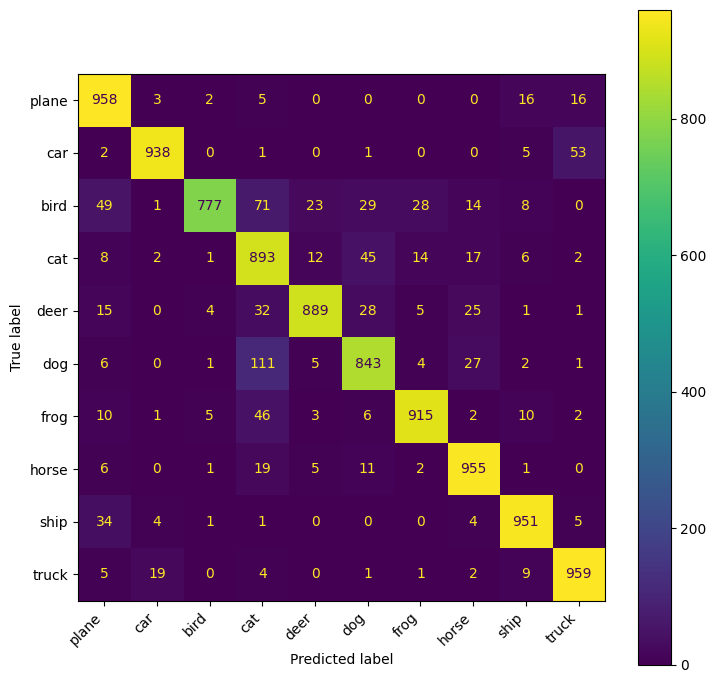

In [ ]:
cm = eval_model(model_gln, phase='val')

The accuracy is very high. We can still see a small confusion between cats and dogs.

## Creating aversarial examples

In [ ]:
# Creating data loaders with batch size of 1
adv_dataloaders, _, _ = get_dataloader(batch_size=1)

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
# Defining epsilon sizes - same as before
epsilons = np.logspace(-3, -1, num=6).round(3)
# Adding zero in the beginning
epsilons = np.insert(epsilons, 0, 0)
accuracies_gln = []
examples_gln = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model_gln, device, adv_dataloaders['val'], eps)
    accuracies_gln.append(acc)
    examples_gln.append(ex)

Epsilon value: 0.0	Test Accuracy = 8855 / 10000 = 0.8855
Epsilon value: 0.001	Test Accuracy = 5984 / 10000 = 0.5984
Epsilon value: 0.003	Test Accuracy = 3047 / 10000 = 0.3047
Epsilon value: 0.006	Test Accuracy = 1692 / 10000 = 0.1692


## Plotting epsilon effect

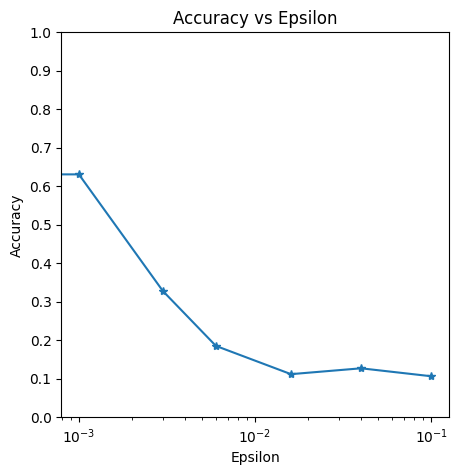

In [ ]:
plot_eps_vs_acc(epsilons, accuracies_gln, examples_gln)

## Plotting examples for GoogLeNet

<Figure size 500x500 with 0 Axes>

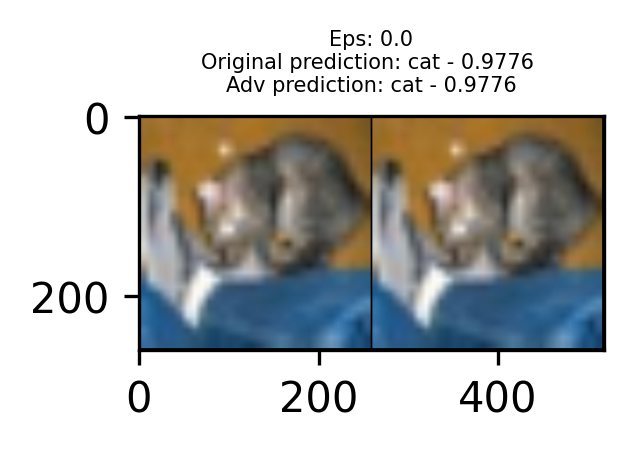

<Figure size 500x500 with 0 Axes>

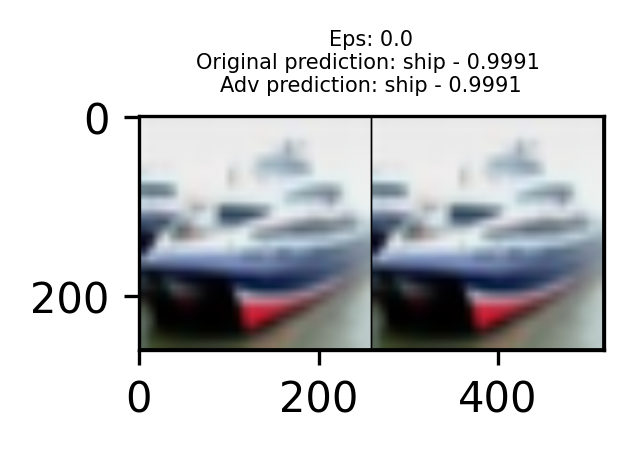

<Figure size 500x500 with 0 Axes>

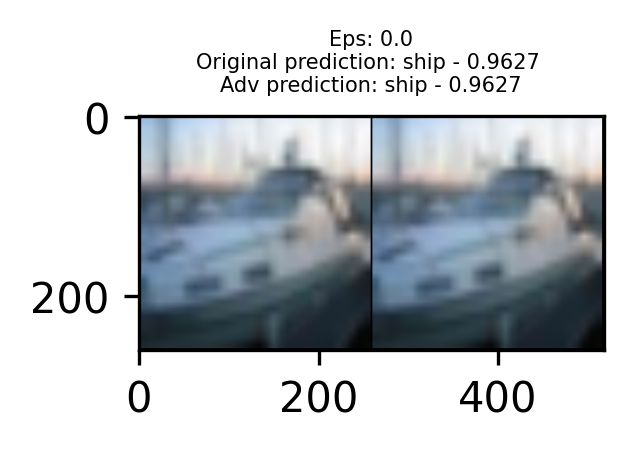

<Figure size 500x500 with 0 Axes>

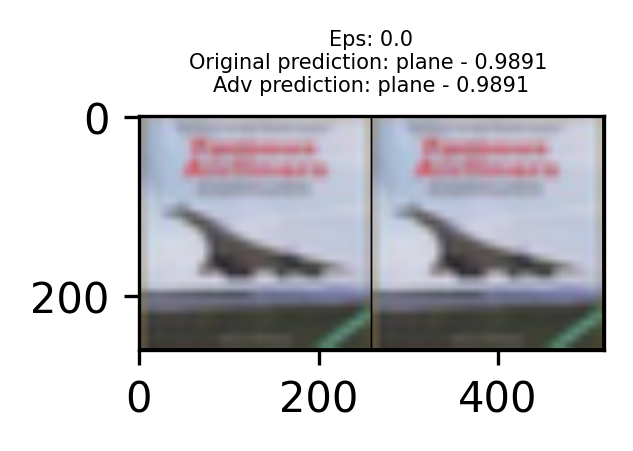

<Figure size 500x500 with 0 Axes>

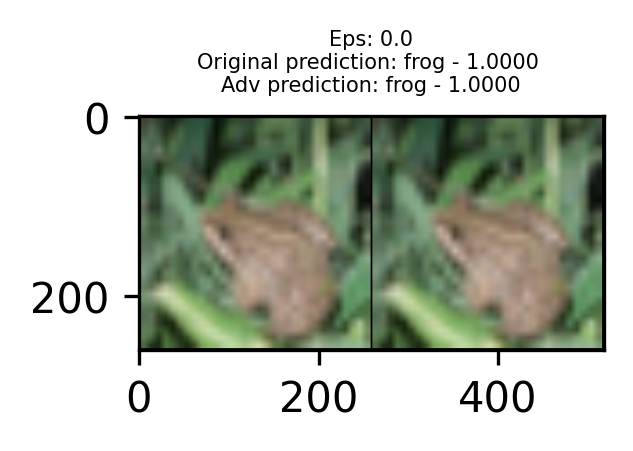

<Figure size 500x500 with 0 Axes>

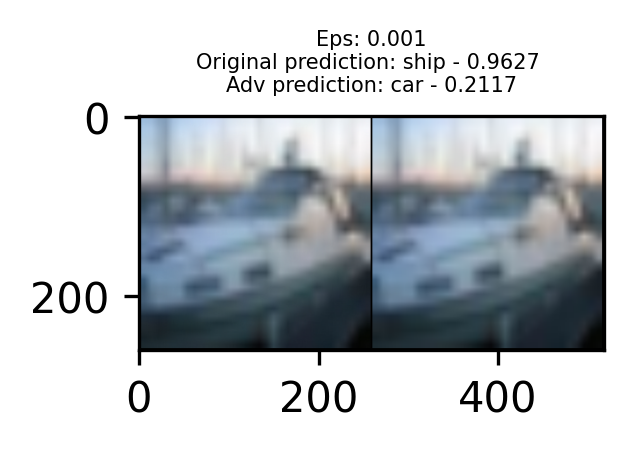

<Figure size 500x500 with 0 Axes>

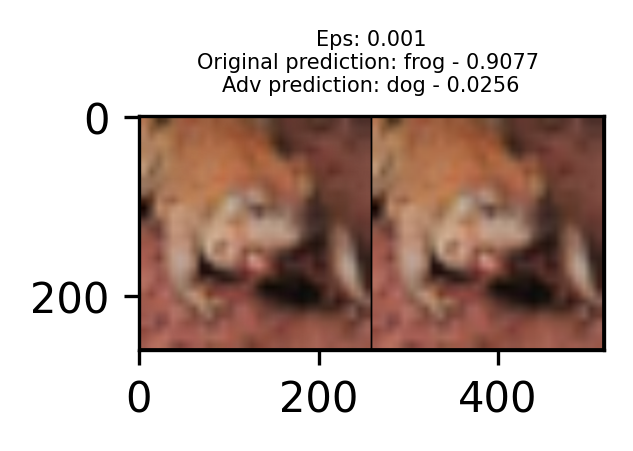

<Figure size 500x500 with 0 Axes>

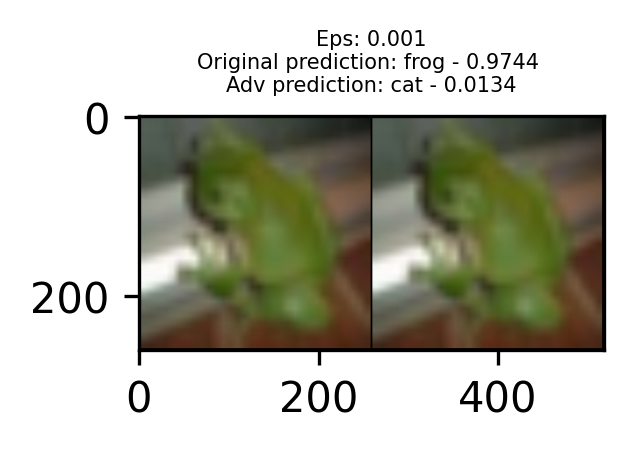

<Figure size 500x500 with 0 Axes>

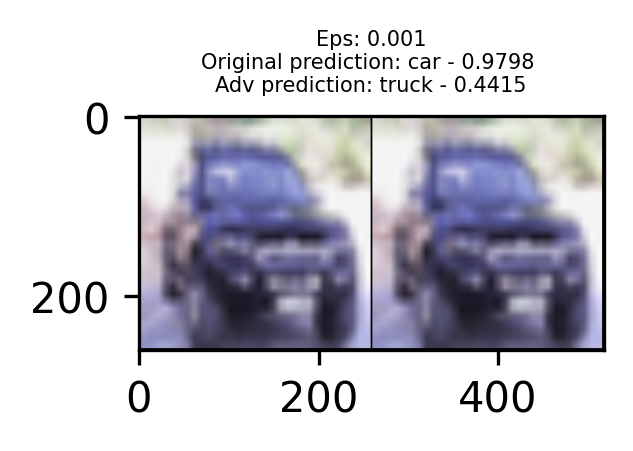

<Figure size 500x500 with 0 Axes>

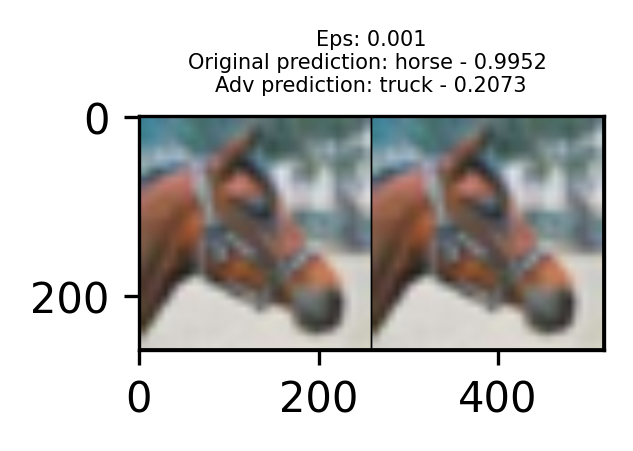

<Figure size 500x500 with 0 Axes>

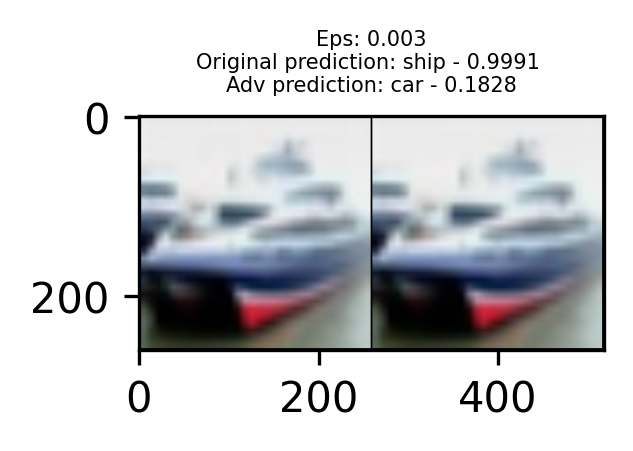

<Figure size 500x500 with 0 Axes>

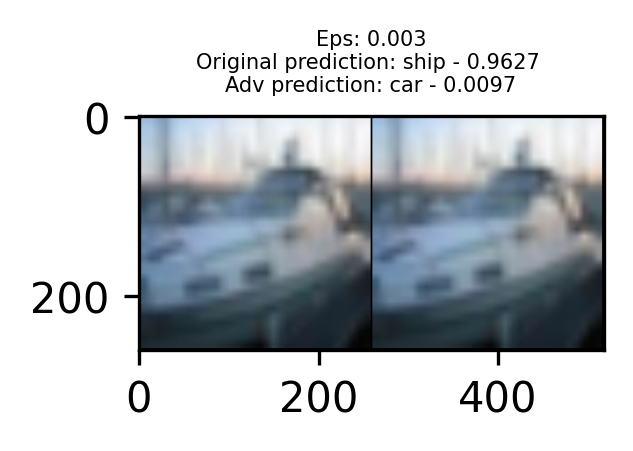

<Figure size 500x500 with 0 Axes>

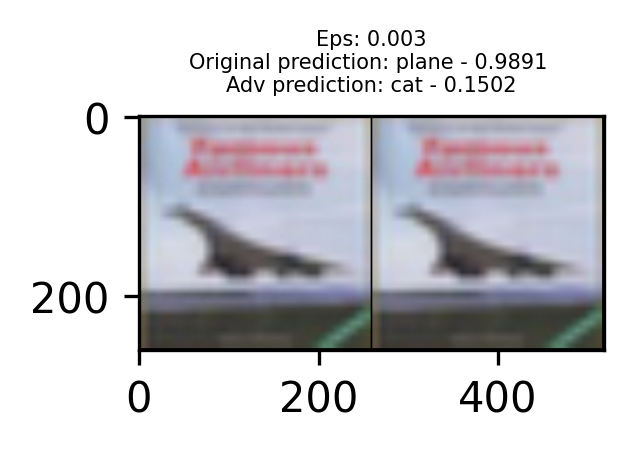

<Figure size 500x500 with 0 Axes>

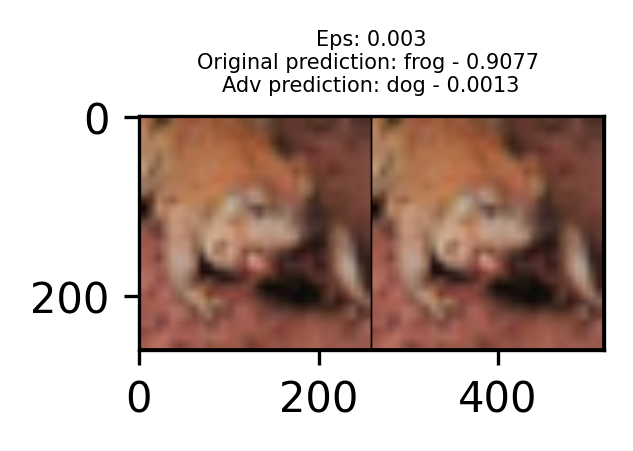

<Figure size 500x500 with 0 Axes>

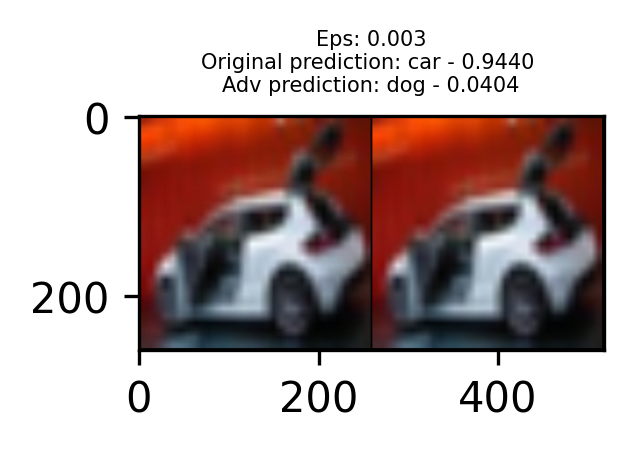

<Figure size 500x500 with 0 Axes>

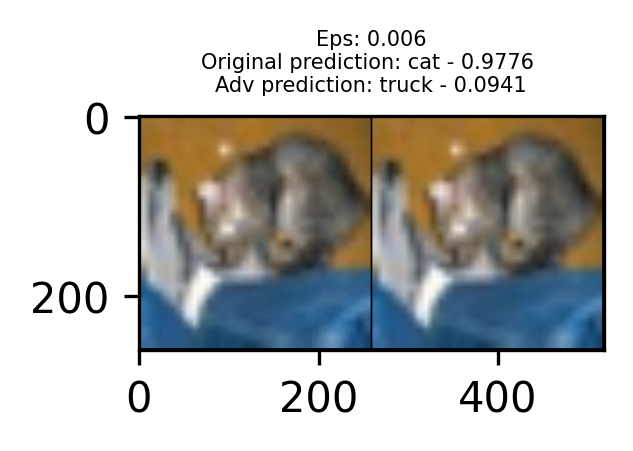

<Figure size 500x500 with 0 Axes>

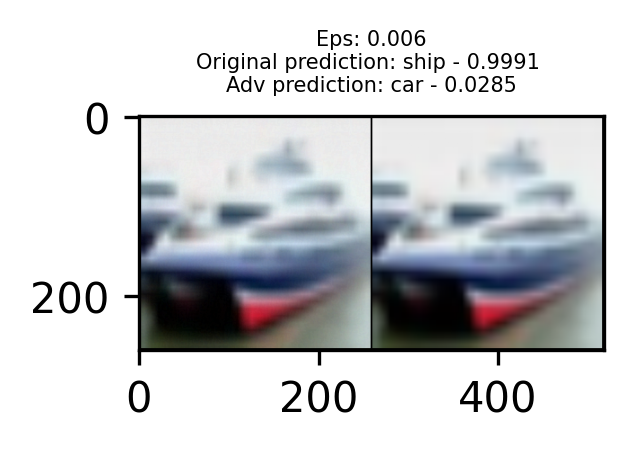

<Figure size 500x500 with 0 Axes>

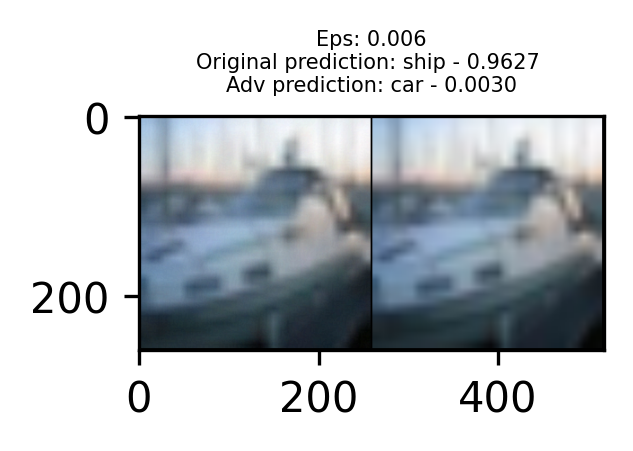

<Figure size 500x500 with 0 Axes>

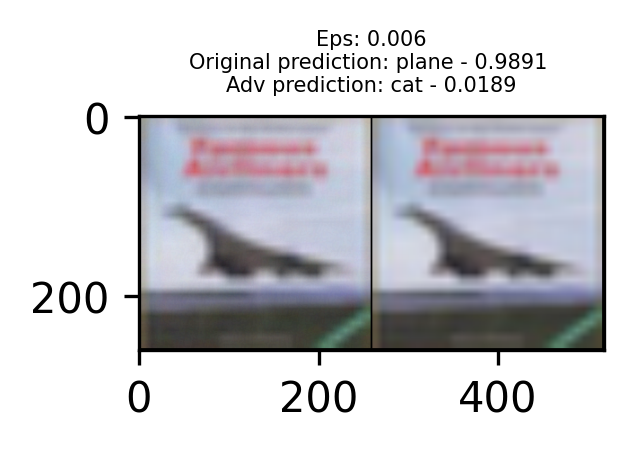

<Figure size 500x500 with 0 Axes>

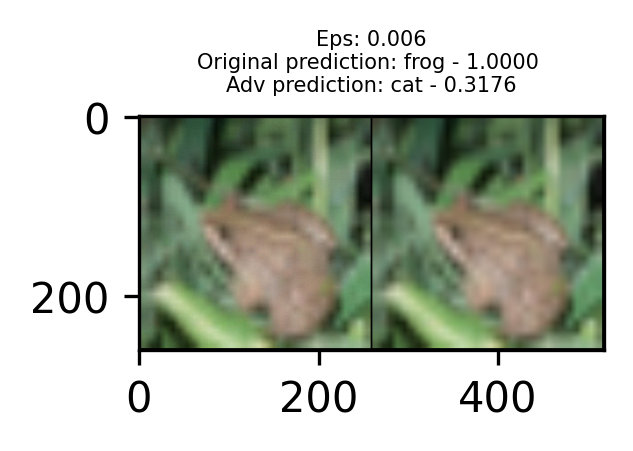

<Figure size 500x500 with 0 Axes>

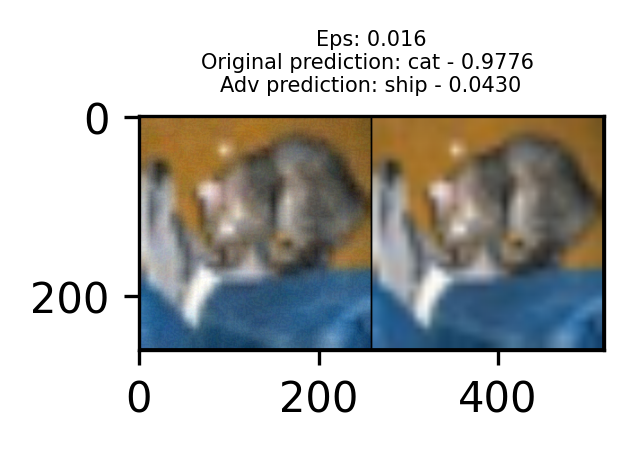

<Figure size 500x500 with 0 Axes>

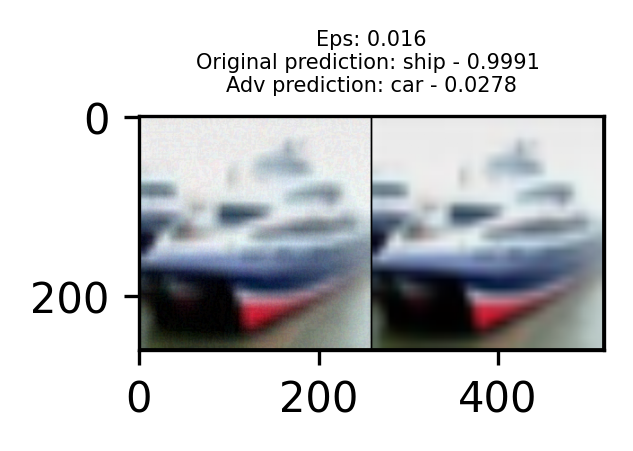

<Figure size 500x500 with 0 Axes>

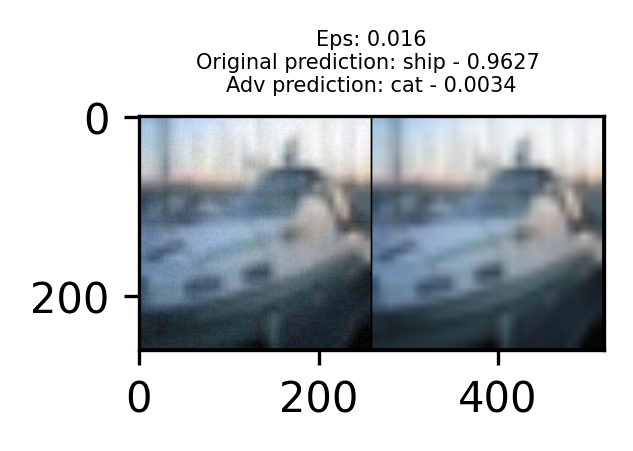

<Figure size 500x500 with 0 Axes>

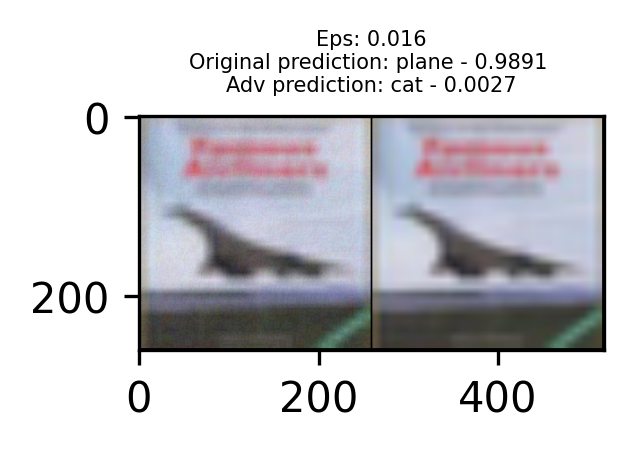

<Figure size 500x500 with 0 Axes>

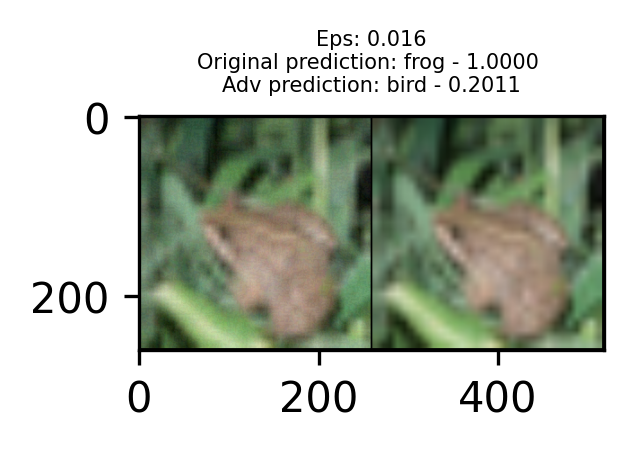

<Figure size 500x500 with 0 Axes>

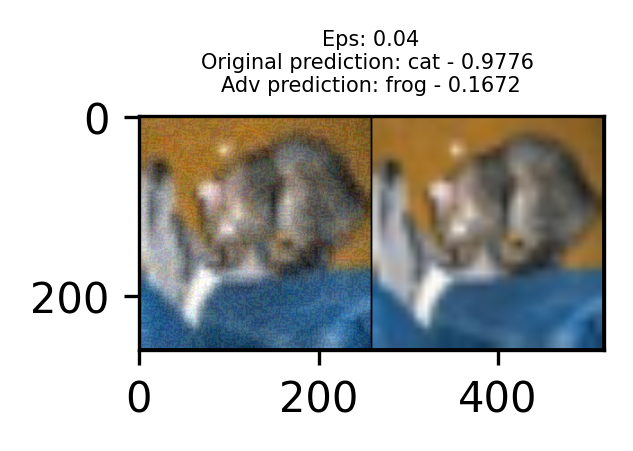

<Figure size 500x500 with 0 Axes>

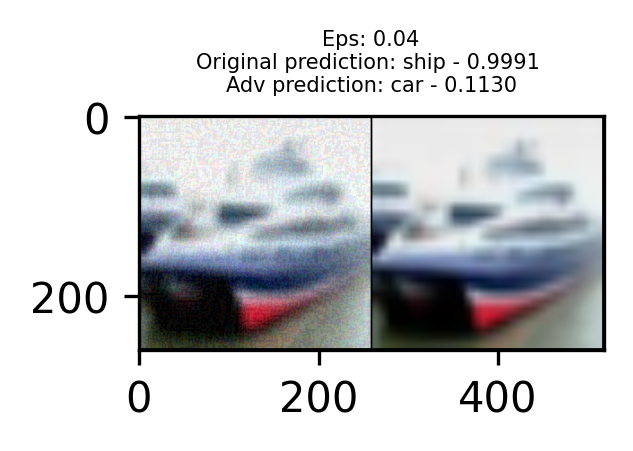

<Figure size 500x500 with 0 Axes>

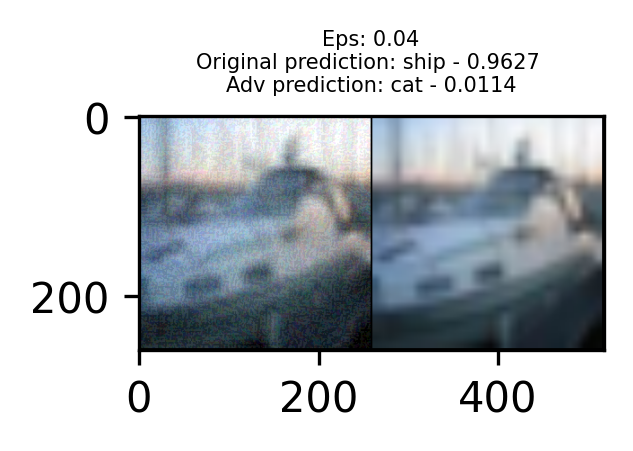

<Figure size 500x500 with 0 Axes>

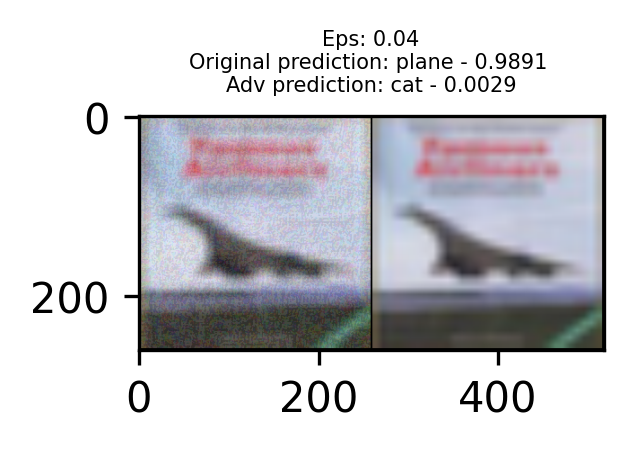

<Figure size 500x500 with 0 Axes>

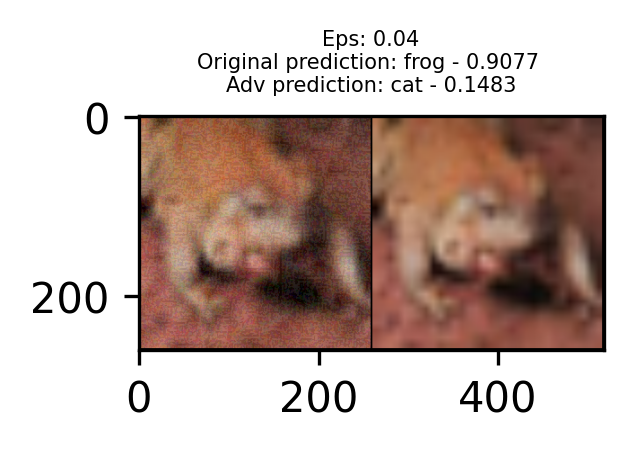

<Figure size 500x500 with 0 Axes>

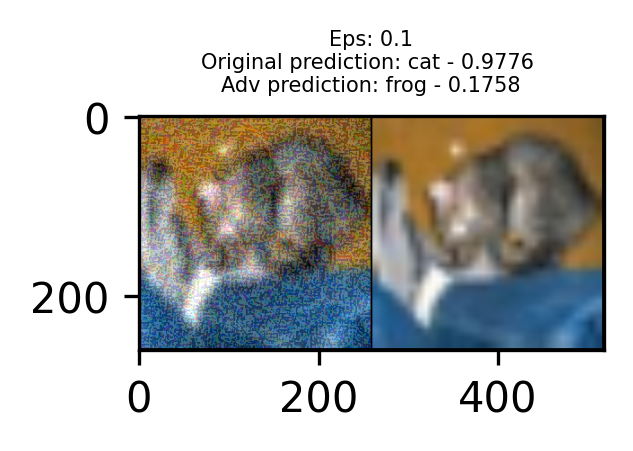

<Figure size 500x500 with 0 Axes>

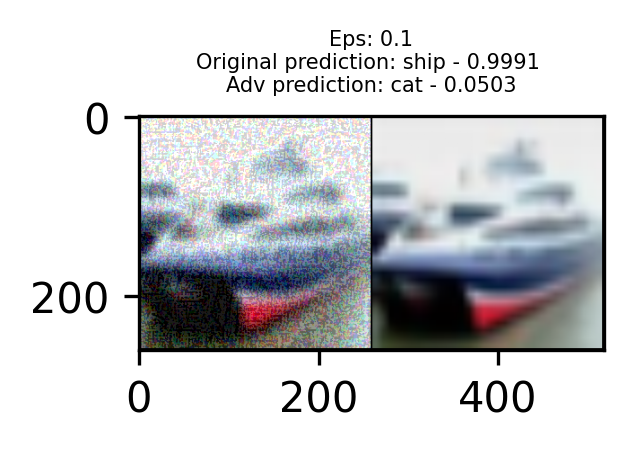

<Figure size 500x500 with 0 Axes>

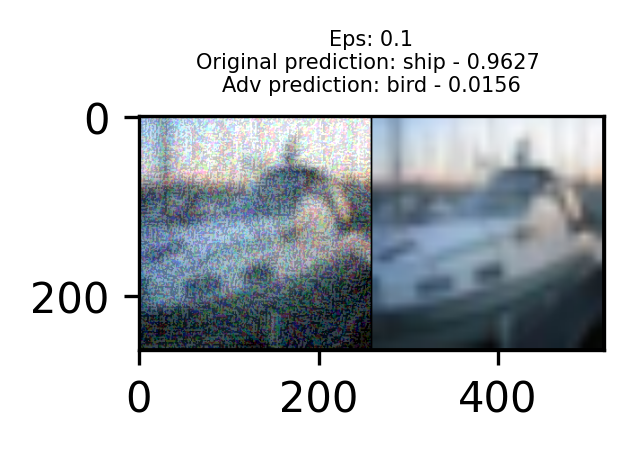

<Figure size 500x500 with 0 Axes>

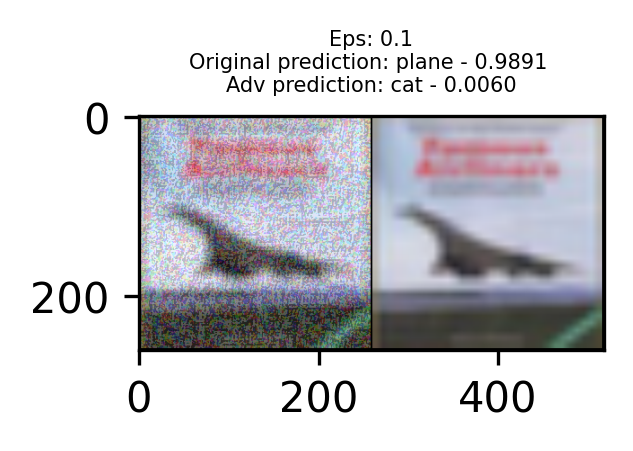

<Figure size 500x500 with 0 Axes>

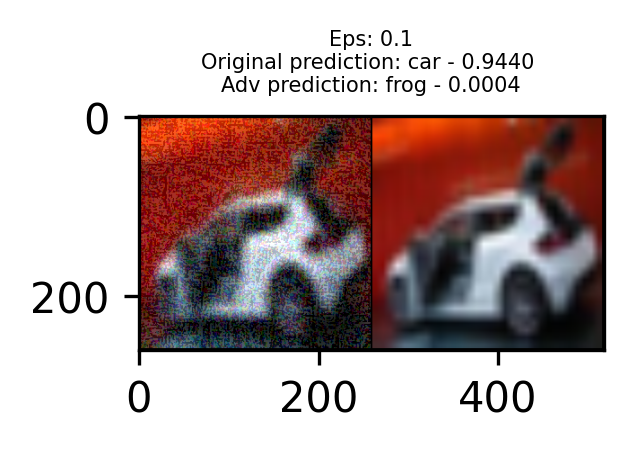

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_adv_examples(epsilons, accuracies_gln, examples_gln)